In [ ]:
#%%

import os

In [ ]:
#%%

import scanpy as sc
import pandas as pd
import numpy as np
import scarches as sca
from scarches.dataset.trvae.data_handling import remove_sparsity
from scipy import sparse
from anndata import AnnData
from typing import Optional, Union

## Initialize folders

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 captum (see https://github.com/pytorch/captum).


In [ ]:
#%%

import configparser

# Read configuration file
config = configparser.ConfigParser()
config.read("../../utils/config.ini")

rawPath = config.get("DEFAULT", "rawPath")
scriptsPath = config.get("DEFAULT", "scriptsPath")
figPath = config.get("DEFAULT", "figPath")

initDir = rawPath + 'metacells_step0/fibroblasts/'
outDir = rawPath + 'integration/metacells/fibroblasts_testing_ovca/'
ooseDir = rawPath + 'out_of_sample_extension/fibroblasts_testing_ovca/'
genes = scriptsPath + '4_hdg/Tables/atlas_hdg_dispersion_patients_fibroblasts.csv'

In [ ]:
#%%

if not os.path.exists(outDir):
    os.makedirs(outDir)
## Setting fig parameteres
sc.settings.set_figure_params(dpi_save=300, frameon=False, format='png')
sc.settings.figdir = figPath + "oose/fibroblasts_testing/"

## Loading reference data and creating integration model

In [ ]:
#%%

ad = sc.read_h5ad("/group/testa/Project/OvarianAtlasTestStep0/OvCA_umap_tiled.h5ad")
major_cell_type = "FibroblastsMSK"
ad = ad[ad.obs["01_major_celltypes"] == major_cell_type]

ad.obs['tissue-treatment'] = ad.obs['02_tissue'].astype('str') + '_' + ad.obs['03_treatment'].astype('str')
ad.obs['cell_type'] = ad.obs.loc[:, 'tissue-treatment']

<ipython-input-5-60b035c1c8b6>:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs['tissue-treatment'] = ad.obs['02_tissue'].astype('str') + '_' + ad.obs['03_treatment'].astype('str')


In [ ]:
ad

AnnData object with n_obs × n_vars = 6639 × 1542
    obs: '02_tissue', '12_developmental_stage', '03_treatment', '11_recurrence', '10_tumor_stage', '14_paper_ID', '09_anatomical_location', '13_dataset', '08_phase', '07_cell_states', '05_cell_types', '06_cell_subtypes', '01_major_celltypes', '04_functional_annotation', 'tissue-treatment', 'cell_type'
    uns: 'functional_annotation_colors', 'major_celltypes_colors', 'tissue_colors'
    obsm: 'X_umap_shifted'

In [ ]:
ad

AnnData object with n_obs × n_vars = 6639 × 1542
    obs: '02_tissue', '12_developmental_stage', '03_treatment', '11_recurrence', '10_tumor_stage', '14_paper_ID', '09_anatomical_location', '13_dataset', '08_phase', '07_cell_states', '05_cell_types', '06_cell_subtypes', '01_major_celltypes', '04_functional_annotation', 'tissue-treatment', 'cell_type'
    uns: 'functional_annotation_colors', 'major_celltypes_colors', 'tissue_colors'
    obsm: 'X_umap_shifted'

In [ ]:
ad.X

array([[ 1.61e+00,  3.93e+00,  5.02e+00,  2.74e-01,  2.86e-01,  1.72e+00,
        -8.57e-02, ...,  4.34e-02,  4.59e+00,  4.66e+00,  6.00e+00,
         6.03e+00,  1.33e+00,  6.95e-02],
       [ 1.79e+00,  3.55e+00,  5.31e+00,  2.93e-01,  6.91e-02,  2.20e+00,
        -7.51e-02, ...,  3.23e-02,  4.99e+00,  4.77e+00,  6.36e+00,
         6.37e+00,  1.52e+00,  4.18e-02],
       [ 1.63e+00,  2.95e+00,  4.97e+00,  1.65e-01, -3.10e-02,  1.69e+00,
        -5.04e-02, ..., -1.04e-02,  4.69e+00,  4.22e+00,  5.88e+00,
         5.95e+00,  1.14e+00, -4.77e-03],
       [ 1.36e+00,  2.98e+00,  4.69e+00,  1.52e-01,  6.02e-02,  1.29e+00,
        -7.05e-02, ..., -3.57e-03,  4.35e+00,  4.03e+00,  5.56e+00,
         5.62e+00,  1.07e+00,  3.37e-02],
       [ 1.49e+00,  3.26e+00,  4.85e+00,  1.43e-01,  6.47e-02,  1.71e+00,
        -7.99e-02, ...,  3.77e-02,  4.48e+00,  4.13e+00,  5.79e+00,
         5.85e+00,  9.65e-01, -1.79e-02],
       [ 1.46e+00,  3.33e+00,  5.04e+00,  2.30e-01,  2.33e-01,  1.27e+00,
      

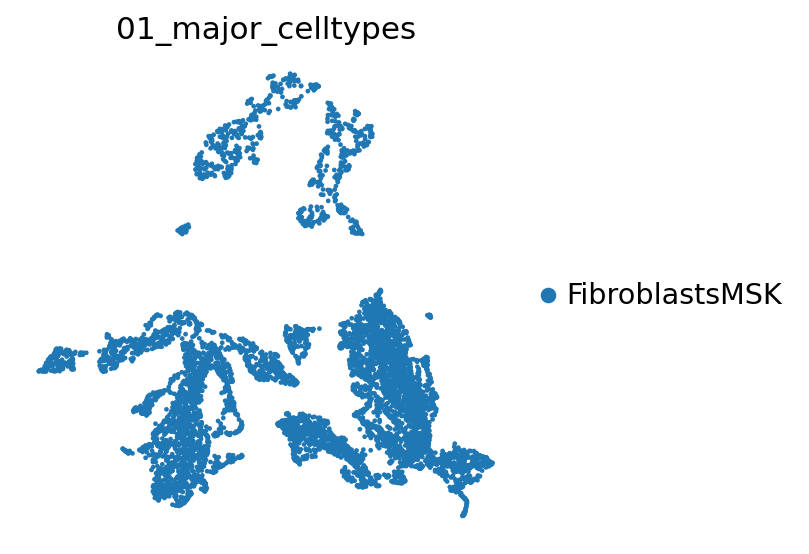

In [ ]:
sc.pl.embedding(ad, basis="umap_shifted", color="01_major_celltypes")

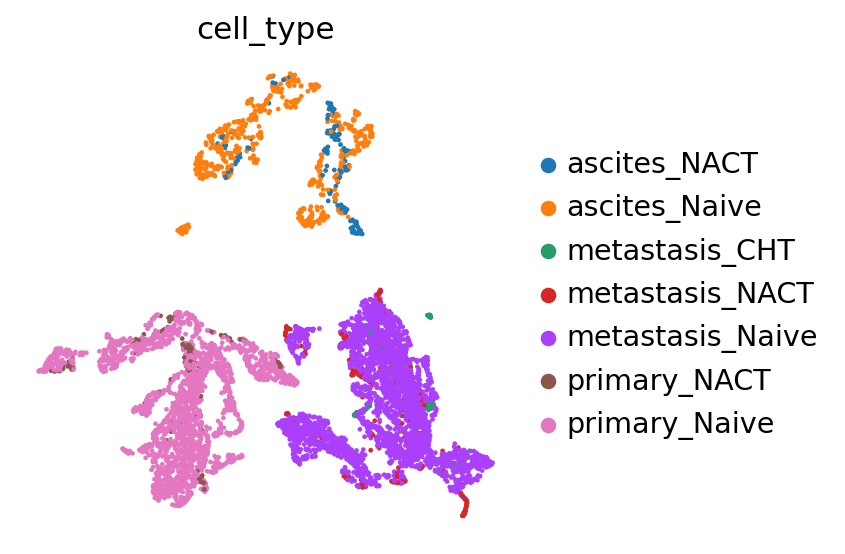

In [ ]:
sc.pl.embedding(ad, basis="umap_shifted", color="cell_type")

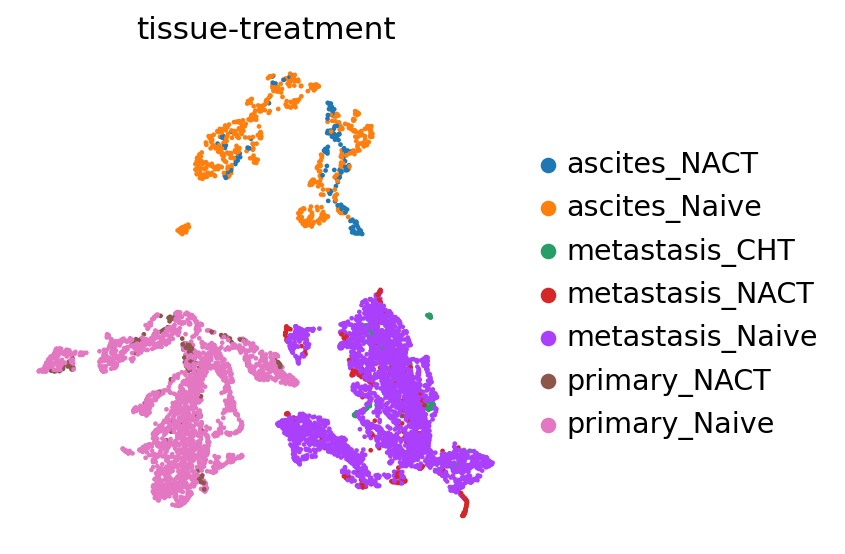

In [ ]:
sc.pl.embedding(ad, basis="umap_shifted", color="tissue-treatment")

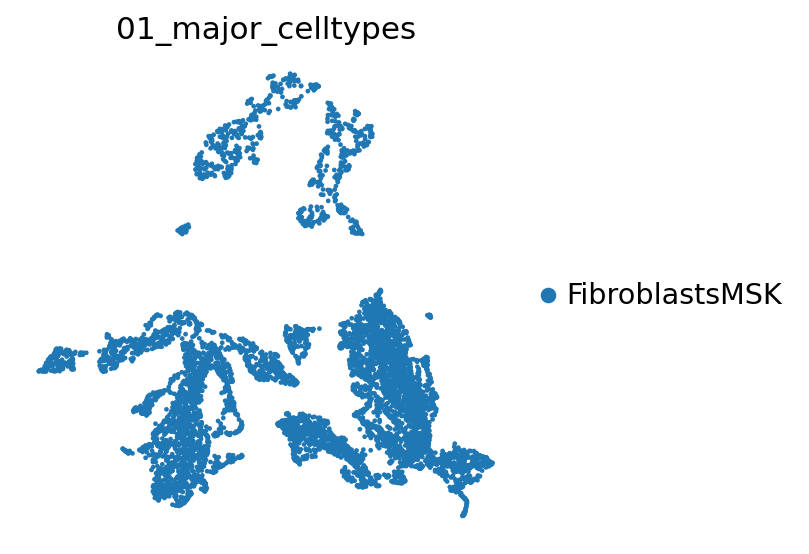

In [ ]:
sc.pl.embedding(ad, basis="umap_shifted", color="01_major_celltypes")

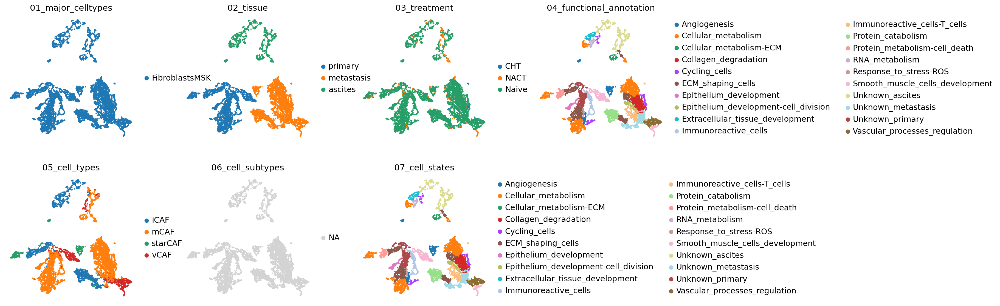

In [ ]:
sc.pl.embedding(ad, basis="umap_shifted", color=["01_major_celltypes", "02_tissue", "03_treatment", "04_functional_annotation", "05_cell_types", "06_cell_subtypes", "07_cell_states"])

In [ ]:
major_cell_type = "FibroblastsMSK"
ad = ad[ad.obs["01_major_celltypes"] == major_cell_type]


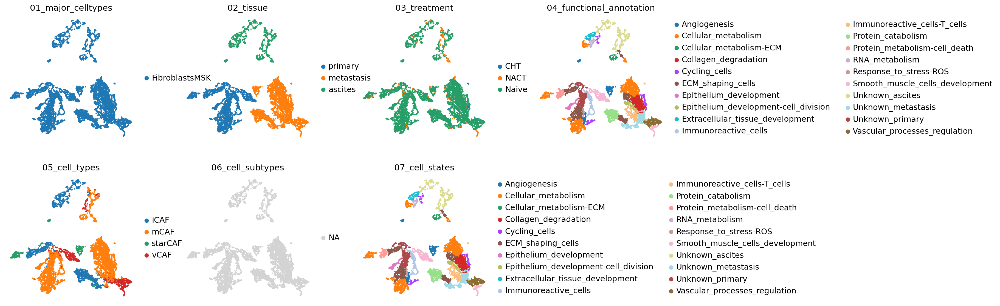

In [ ]:
sc.pl.embedding(ad, basis="umap_shifted", color=["01_major_celltypes", "02_tissue", "03_treatment", "04_functional_annotation", "05_cell_types", "06_cell_subtypes", "07_cell_states"])

In [ ]:
ad

View of AnnData object with n_obs × n_vars = 6639 × 1542
    obs: '02_tissue', '12_developmental_stage', '03_treatment', '11_recurrence', '10_tumor_stage', '14_paper_ID', '09_anatomical_location', '13_dataset', '08_phase', '07_cell_states', '05_cell_types', '06_cell_subtypes', '01_major_celltypes', '04_functional_annotation', 'tissue-treatment', 'cell_type'
    uns: 'functional_annotation_colors', 'major_celltypes_colors', 'tissue_colors', '01_major_celltypes_colors', 'cell_type_colors', 'tissue-treatment_colors', '02_tissue_colors', '03_treatment_colors', '04_functional_annotation_colors', '05_cell_types_colors', '06_cell_subtypes_colors', '07_cell_states_colors'
    obsm: 'X_umap_shifted'

In [ ]:
#%%

#sc.pp.log1p(ad)
# ad = ad.raw.to_adata()
# hdg = pd.read_csv(genes, index_col=0)
# ad.var['highly_variable'] = hdg.highly_variable
# ad.var.highly_variable = ad.var.highly_variable.fillna(False)
# ad.raw = ad.copy()
# ad = ad[:, ad.var.highly_variable]
sc.tl.pca(ad, use_highly_variable=True)
sc.pp.neighbors(ad, use_rep='X_pca')
sc.tl.umap(ad)

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


ValueError: Did not find `adata.var['highly_variable']`. Either add the mask first to `adata.var`or consider using the mask argument with a boolean array.

In [ ]:
#%%

#sc.pp.log1p(ad)
# ad = ad.raw.to_adata()
# hdg = pd.read_csv(genes, index_col=0)
# ad.var['highly_variable'] = hdg.highly_variable
# ad.var.highly_variable = ad.var.highly_variable.fillna(False)
# ad.raw = ad.copy()
# ad = ad[:, ad.var.highly_variable]
sc.tl.pca(ad)
sc.pp.neighbors(ad, use_rep='X_pca')
sc.tl.umap(ad)

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


In [ ]:
#%%

def remove_sparsity(adata):
    """
    If `adata.X` is a sparse matrix, this will convert it to a normal (dense) matrix.

    Parameters:
    adata : AnnData
        Annotated dataset.

    Returns:
    AnnData
        Annotated dataset with dense matrix if it was originally sparse.
    """
    if sparse.issparse(adata.X):
        # Use toarray() method to convert sparse matrix to dense
        new_adata = sc.AnnData(X=adata.X.toarray(), obs=adata.obs.copy(deep=True), var=adata.var.copy(deep=True))
        return new_adata
    return adata

ad = remove_sparsity(ad) # remove sparsity
ad.X = ad.X.astype('float32')

In [ ]:
#%%

condition_key = 'paper_ID'
cell_type_key = 'cell_type'

epoch = 100

early_stopping_kwargs = {
    "early_stopping_metric": "val_loss",
    "patience": 25,
    "threshold": 0,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

network = sca.models.scgen(adata = ad, hidden_layer_sizes=[800,100])


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out: 1542 800
	Hidden Layer 1 in/out: 800 100
	Mean/Var Layer in/out: 100 10
Decoder Architecture:
	First Layer in, out 10 100
	Hidden Layer 1 in/out: 100 800
	Output Layer in/out:  800 1542 



In [ ]:
#%%

network.train(n_epochs=epoch, early_stopping_kwargs = early_stopping_kwargs)

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |--------------------| 1.0%  - epoch_loss: 0.2053680729 - val_loss: 0.0654097134

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |--------------------| 2.0%  - epoch_loss: 0.0861533757 - val_loss: 0.0430533036

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |--------------------| 3.0%  - epoch_loss: 0.0704949117 - val_loss: 0.0360606322

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |--------------------| 4.0%  - epoch_loss: 0.0621829437 - val_loss: 0.0378928651

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█-------------------| 5.0%  - epoch_loss: 0.0562576677 - val_loss: 0.0293559347

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█-------------------| 6.0%  - epoch_loss: 0.0511505418 - val_loss: 0.0242949845

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█-------------------| 7.0%  - epoch_loss: 0.0491249433 - val_loss: 0.0250908426

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█-------------------| 8.0%  - epoch_loss: 0.0472690280 - val_loss: 0.0243069705

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█-------------------| 9.0%  - epoch_loss: 0.0456290840 - val_loss: 0.0235900388

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██------------------| 10.0%  - epoch_loss: 0.0445455507 - val_loss: 0.0215011023

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██------------------| 11.0%  - epoch_loss: 0.0438811791 - val_loss: 0.0203926643

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██------------------| 12.0%  - epoch_loss: 0.0419671313 - val_loss: 0.0183849336

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██------------------| 13.0%  - epoch_loss: 0.0409405992 - val_loss: 0.0190158602

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██------------------| 14.0%  - epoch_loss: 0.0411511457 - val_loss: 0.0185793904

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███-----------------| 15.0%  - epoch_loss: 0.0398725563 - val_loss: 0.0221611280

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███-----------------| 16.0%  - epoch_loss: 0.0395803356 - val_loss: 0.0222507179

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███-----------------| 17.0%  - epoch_loss: 0.0386706850 - val_loss: 0.0190922965

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███-----------------| 18.0%  - epoch_loss: 0.0388606810 - val_loss: 0.0195136632

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███-----------------| 19.0%  - epoch_loss: 0.0375780291 - val_loss: 0.0167530207

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████----------------| 20.0%  - epoch_loss: 0.0373866425 - val_loss: 0.0162800882

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████----------------| 21.0%  - epoch_loss: 0.0366275427 - val_loss: 0.0176213341

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████----------------| 22.0%  - epoch_loss: 0.0364041670 - val_loss: 0.0184496694

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████----------------| 23.0%  - epoch_loss: 0.0358682013 - val_loss: 0.0175628365

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████----------------| 24.0%  - epoch_loss: 0.0349038004 - val_loss: 0.0143852385

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████---------------| 25.0%  - epoch_loss: 0.0348789521 - val_loss: 0.0174829640

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████---------------| 26.0%  - epoch_loss: 0.0344696927 - val_loss: 0.0171951688

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████---------------| 27.0%  - epoch_loss: 0.0341812616 - val_loss: 0.0158059076

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████---------------| 28.0%  - epoch_loss: 0.0344537133 - val_loss: 0.0162998655

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████---------------| 29.0%  - epoch_loss: 0.0334673914 - val_loss: 0.0137099991

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████--------------| 30.0%  - epoch_loss: 0.0330552415 - val_loss: 0.0157259993

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████--------------| 31.0%  - epoch_loss: 0.0323758018 - val_loss: 0.0156758617

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████--------------| 32.0%  - epoch_loss: 0.0324434320 - val_loss: 0.0152201886

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████--------------| 33.0%  - epoch_loss: 0.0319312589 - val_loss: 0.0136966221

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████--------------| 34.0%  - epoch_loss: 0.0322699644 - val_loss: 0.0148184312

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████-------------| 35.0%  - epoch_loss: 0.0313444966 - val_loss: 0.0146604493

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████-------------| 36.0%  - epoch_loss: 0.0314971985 - val_loss: 0.0140840292

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████-------------| 37.0%  - epoch_loss: 0.0310243127 - val_loss: 0.0139727589

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████-------------| 38.0%  - epoch_loss: 0.0312849807 - val_loss: 0.0140110778

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████-------------| 39.0%  - epoch_loss: 0.0301800706 - val_loss: 0.0139044828

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████------------| 40.0%  - epoch_loss: 0.0303657977 - val_loss: 0.0128892396

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████------------| 41.0%  - epoch_loss: 0.0301697832 - val_loss: 0.0143821502

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████------------| 42.0%  - epoch_loss: 0.0298768436 - val_loss: 0.0135312592

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████------------| 43.0%  - epoch_loss: 0.0290477105 - val_loss: 0.0120754620

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████------------| 44.0%  - epoch_loss: 0.0292295235 - val_loss: 0.0123044235

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████-----------| 45.0%  - epoch_loss: 0.0289352725 - val_loss: 0.0126120712

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████-----------| 46.0%  - epoch_loss: 0.0291852462 - val_loss: 0.0131509503

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████-----------| 47.0%  - epoch_loss: 0.0285150845 - val_loss: 0.0127559327

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████-----------| 48.0%  - epoch_loss: 0.0283248407 - val_loss: 0.0116865794

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████-----------| 49.0%  - epoch_loss: 0.0277691237 - val_loss: 0.0112515539

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████----------| 50.0%  - epoch_loss: 0.0277477766 - val_loss: 0.0111753961

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████----------| 51.0%  - epoch_loss: 0.0279787474 - val_loss: 0.0127733789

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████----------| 52.0%  - epoch_loss: 0.0275255305 - val_loss: 0.0117488826

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████----------| 53.0%  - epoch_loss: 0.0267641179 - val_loss: 0.0119902165

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████----------| 54.0%  - epoch_loss: 0.0271684214 - val_loss: 0.0127949896

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████---------| 55.0%  - epoch_loss: 0.0272054457 - val_loss: 0.0147179741

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████---------| 56.0%  - epoch_loss: 0.0267023785 - val_loss: 0.0133276199

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████---------| 57.0%  - epoch_loss: 0.0265591183 - val_loss: 0.0113946833

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████---------| 58.0%  - epoch_loss: 0.0265693632 - val_loss: 0.0142636257

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████---------| 59.0%  - epoch_loss: 0.0264862332 - val_loss: 0.0121829523

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████--------| 60.0%  - epoch_loss: 0.0263726329 - val_loss: 0.0118326268

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████--------| 61.0%  - epoch_loss: 0.0259100963 - val_loss: 0.0129066634

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████--------| 62.0%  - epoch_loss: 0.0256547355 - val_loss: 0.0133045685

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████--------| 63.0%  - epoch_loss: 0.0259063891 - val_loss: 0.0112459379

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████--------| 64.0%  - epoch_loss: 0.0255159418 - val_loss: 0.0111474346
ADJUSTED LR


/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████████-------| 65.0%  - epoch_loss: 0.0218167658 - val_loss: 0.0075604835

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████████-------| 66.0%  - epoch_loss: 0.0213453069 - val_loss: 0.0072387719

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████████-------| 67.0%  - epoch_loss: 0.0210531393 - val_loss: 0.0074439153

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████████-------| 68.0%  - epoch_loss: 0.0211339230 - val_loss: 0.0075448520

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████████-------| 69.0%  - epoch_loss: 0.0209402481 - val_loss: 0.0076449741

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████████------| 70.0%  - epoch_loss: 0.0208803452 - val_loss: 0.0074838796

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████████------| 71.0%  - epoch_loss: 0.0207129914 - val_loss: 0.0076403302

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████████------| 72.0%  - epoch_loss: 0.0206268741 - val_loss: 0.0075996466

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████████------| 73.0%  - epoch_loss: 0.0206159487 - val_loss: 0.0072878316

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████████------| 74.0%  - epoch_loss: 0.0208183604 - val_loss: 0.0071786568

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████████-----| 75.0%  - epoch_loss: 0.0205399433 - val_loss: 0.0074279352

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████████-----| 76.0%  - epoch_loss: 0.0204964385 - val_loss: 0.0073693580

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████████-----| 77.0%  - epoch_loss: 0.0204304522 - val_loss: 0.0071521563

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████████-----| 78.0%  - epoch_loss: 0.0203876719 - val_loss: 0.0073044469

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████████-----| 79.0%  - epoch_loss: 0.0205028993 - val_loss: 0.0074305012

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████████----| 80.0%  - epoch_loss: 0.0204128821 - val_loss: 0.0078354930

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████████----| 81.0%  - epoch_loss: 0.0203544643 - val_loss: 0.0070079099

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████████----| 82.0%  - epoch_loss: 0.0204115498 - val_loss: 0.0075421954

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████████----| 83.0%  - epoch_loss: 0.0204872996 - val_loss: 0.0079097831

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████████----| 84.0%  - epoch_loss: 0.0204362198 - val_loss: 0.0077991814

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████████████---| 85.0%  - epoch_loss: 0.0202114387 - val_loss: 0.0074707178

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████████████---| 86.0%  - epoch_loss: 0.0202717607 - val_loss: 0.0076636695

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████████████---| 87.0%  - epoch_loss: 0.0201759395 - val_loss: 0.0078908531

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████████████---| 88.0%  - epoch_loss: 0.0201314128 - val_loss: 0.0070459479

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |█████████████████---| 89.0%  - epoch_loss: 0.0202577545 - val_loss: 0.0072788329

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████████████--| 90.0%  - epoch_loss: 0.0199150711 - val_loss: 0.0079069933

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████████████--| 91.0%  - epoch_loss: 0.0201758253 - val_loss: 0.0078204205

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████████████--| 92.0%  - epoch_loss: 0.0200367817 - val_loss: 0.0075487486

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████████████--| 93.0%  - epoch_loss: 0.0201382840 - val_loss: 0.0074141524

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |██████████████████--| 94.0%  - epoch_loss: 0.0202083288 - val_loss: 0.0076461322

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████████████-| 95.0%  - epoch_loss: 0.0199729512 - val_loss: 0.0075926974
ADJUSTED LR


/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████████████-| 96.0%  - epoch_loss: 0.0194200340 - val_loss: 0.0073714261

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████████████-| 97.0%  - epoch_loss: 0.0194286237 - val_loss: 0.0071671330

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████████████-| 98.0%  - epoch_loss: 0.0193704478 - val_loss: 0.0073909945

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |███████████████████-| 99.0%  - epoch_loss: 0.0192426228 - val_loss: 0.0075411545

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/usr/local/conda/envs/

 |████████████████████| 100.0%  - epoch_loss: 0.0192823586 - val_loss: 0.0075570406
Saving best state of network...
Best State was in Epoch 80
Saving best state of network...
Best State was in Epoch 80


In [ ]:
#%%

corrected_reference_adata = network.batch_removal(ad, batch_key="14_paper_ID", cell_label_key="cell_type",return_latent=True)

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scarches/models/scgen/vaearith.py:294: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  all_shared_ann = anndata.AnnData.concatenate(*shared_ct, batch_key="concat_batch", index_unique=None)
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scarches/models/scgen/vaearith.py:302: ImplicitModificationWarning: Setting element `.layers['original_data']` of view, initializing view as actual.
  corrected.layers["original_data"] = adata.X


In [ ]:
corrected_reference_adata

AnnData object with n_obs × n_vars = 6639 × 1542
    obs: '02_tissue', '12_developmental_stage', '03_treatment', '11_recurrence', '10_tumor_stage', '14_paper_ID', '09_anatomical_location', '13_dataset', '08_phase', '07_cell_states', '05_cell_types', '06_cell_subtypes', '01_major_celltypes', '04_functional_annotation', 'tissue-treatment', 'cell_type'
    obsm: 'original_data', 'latent_corrected'
    layers: 'original_data'

In [ ]:
corrected_reference_adata.X

array([[ 1.58e+00,  3.79e+00,  4.93e+00,  2.18e-01,  2.12e-01,  1.60e+00,
        -7.35e-02, ...,  4.43e-02,  4.54e+00,  4.51e+00,  5.85e+00,
         5.87e+00,  1.31e+00,  5.91e-02],
       [ 1.69e+00,  3.48e+00,  5.04e+00,  2.11e-01,  7.15e-02,  1.95e+00,
        -6.59e-02, ...,  2.99e-02,  4.76e+00,  4.53e+00,  6.00e+00,
         6.01e+00,  1.44e+00,  1.99e-02],
       [ 1.52e+00,  2.88e+00,  4.85e+00,  1.67e-01, -2.37e-02,  1.48e+00,
        -3.96e-02, ...,  9.74e-03,  4.59e+00,  4.09e+00,  5.67e+00,
         5.73e+00,  1.08e+00, -4.57e-03],
       [ 1.24e+00,  2.88e+00,  4.52e+00,  1.31e-01,  3.18e-02,  1.11e+00,
        -6.30e-02, ...,  5.82e-03,  4.19e+00,  3.87e+00,  5.39e+00,
         5.43e+00,  1.03e+00,  1.46e-02],
       [ 1.45e+00,  3.21e+00,  4.77e+00,  1.47e-01,  6.62e-02,  1.53e+00,
        -4.99e-02, ...,  3.43e-02,  4.45e+00,  4.05e+00,  5.68e+00,
         5.74e+00,  9.67e-01, -2.44e-03],
       [ 1.39e+00,  3.18e+00,  4.97e+00,  2.17e-01,  1.96e-01,  1.16e+00,
      

In [ ]:
sc.pp.neighbors(corrected_reference_adata, use_rep="latent_corrected")
sc.tl.umap(corrected_reference_adata)



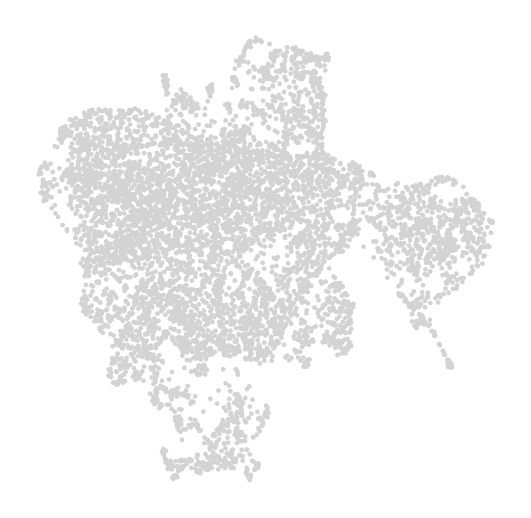

In [ ]:
sc.pl.umap(corrected_reference_adata)

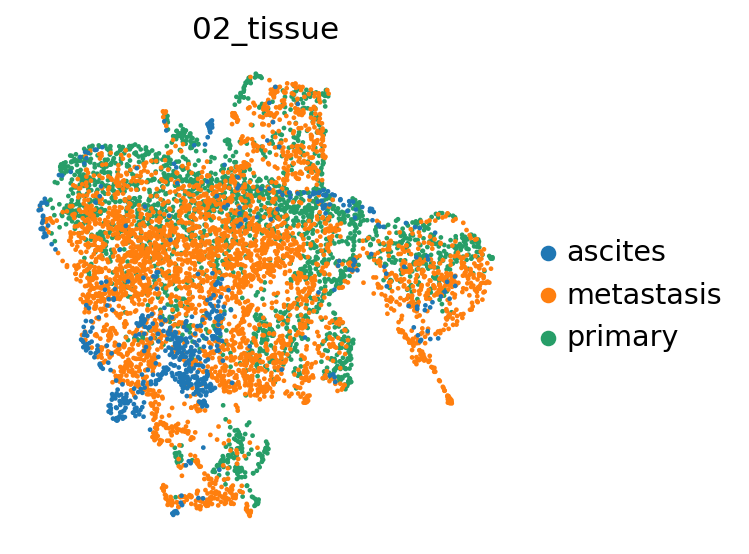

In [ ]:
sc.pl.umap(corrected_reference_adata, color="02_tissue")

In [ ]:
#%%

corrected_reference_adata.write_h5ad(outDir + 'seacells_hdg_patients_batch_corr_scgen_scarches_tissuetreat.h5ad')
### Plot latent space

In [ ]:
corrected_reference_adata

AnnData object with n_obs × n_vars = 6639 × 1542
    obs: '02_tissue', '12_developmental_stage', '03_treatment', '11_recurrence', '10_tumor_stage', '14_paper_ID', '09_anatomical_location', '13_dataset', '08_phase', '07_cell_states', '05_cell_types', '06_cell_subtypes', '01_major_celltypes', '04_functional_annotation', 'tissue-treatment', 'cell_type'
    uns: 'neighbors', 'umap', '02_tissue_colors'
    obsm: 'original_data', 'latent_corrected', 'X_umap'
    layers: 'original_data'
    obsp: 'distances', 'connectivities'

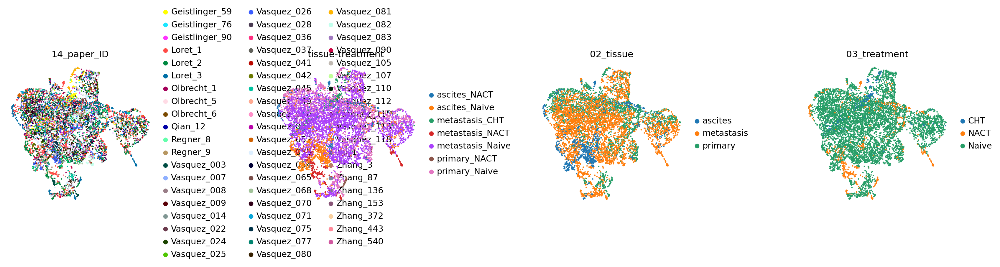

In [ ]:
#%%

sc.pp.neighbors(corrected_reference_adata, use_rep="latent_corrected")
sc.tl.umap(corrected_reference_adata)
sc.pl.umap(corrected_reference_adata,
           color=['14_paper_ID', 'tissue-treatment', '02_tissue', '03_treatment'],
           frameon=False,
           wspace=0.6,
           )

### Plot corrected data

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 1542 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


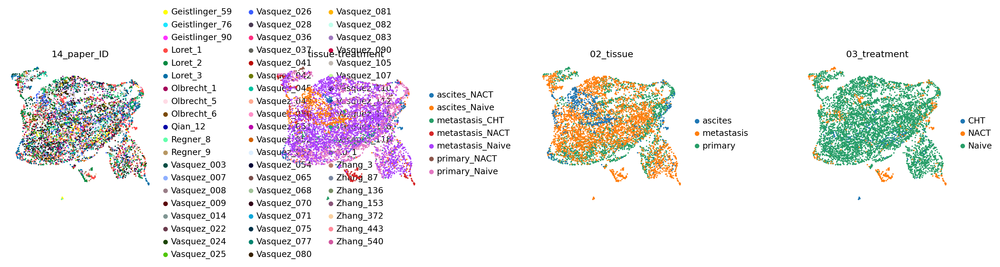

In [ ]:
#%%

sc.pp.neighbors(corrected_reference_adata)
sc.tl.umap(corrected_reference_adata)
sc.pl.umap(corrected_reference_adata,
           color=['14_paper_ID', 'tissue-treatment', '02_tissue', '03_treatment'],
           frameon=False,
           wspace=0.6,
           )

In [ ]:
#%%

ref_path = rawPath + 'integration/metacells/saved_models/fibroblasts_batch_removal_tissuetreatment_scarches'
network.save(ref_path, overwrite=True)

## Project query on top of reference

### Query data needs to be preprocessed same way as reference data with same genes

In [ ]:
#%%

adata_target_path = "/group/testa/Project/OvarianAtlasTestStep0/raw_data/metacells_step0/fibroblasts/" + 'seacells_hdg_patients.h5ad'
adata_target = sc.read_h5ad(adata_target_path)
adata_target.obs['tissue-treatment'] = adata_target.obs['tissue'].astype('str') + '_' + adata_target.obs['treatment'].astype('str')
adata_target.obs['cell_type'] = adata_target.obs.loc[:, 'tissue-treatment']

In [ ]:
adata_target

AnnData object with n_obs × n_vars = 6654 × 17063
    obs: 'tissue', 'developmental_stage', 'treatment', 'recurrence', 'tumor_stage', 'paper_ID', 'anatomical_location', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CancerMSK', 'EndothelialMSK', 'FibroblastsMSK', 'HematopoieticMSK', 'max', 'cell_types', 'SEACell', '# Single Cells', 'tissue-treatment', 'cell_type'
    layers: 'raw'

In [ ]:
adata_target.X

<6654x17063 sparse matrix of type '<class 'numpy.float64'>'
	with 55966000 stored elements in Compressed Sparse Row format>

In [ ]:
adata_target.X.todense()

matrix([[0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 3.12e+00, 0.00e+00,
         0.00e+00, ..., 6.57e+01, 5.78e+01, 2.60e+01, 6.60e+01, 4.87e+01,
         1.26e+01, 6.23e+01],
        [0.00e+00, 1.09e+00, 0.00e+00, 1.36e+00, 1.04e+01, 0.00e+00,
         0.00e+00, ..., 1.99e+02, 1.79e+02, 5.91e+01, 2.01e+02, 1.25e+02,
         3.02e+01, 1.91e+02],
        [1.18e+00, 3.11e+00, 0.00e+00, 9.29e-01, 1.55e+01, 0.00e+00,
         1.99e+00, ..., 2.78e+02, 2.54e+02, 1.14e+02, 2.85e+02, 1.93e+02,
         4.56e+01, 2.69e+02],
        [0.00e+00, 0.00e+00, 0.00e+00, 1.10e+00, 2.04e+00, 0.00e+00,
         0.00e+00, ..., 7.28e+01, 6.71e+01, 2.55e+01, 7.23e+01, 5.39e+01,
         1.51e+01, 6.98e+01],
        [0.00e+00, 1.33e+00, 7.07e-01, 7.05e-01, 1.72e+01, 1.57e+00,
         2.96e+00, ..., 2.47e+02, 2.31e+02, 1.49e+02, 2.58e+02, 2.00e+02,
         5.42e+01, 2.41e+02],
        [0.00e+00, 9.26e-01, 0.00e+00, 1.72e+00, 4.68e+00, 4.01e-01,
         9.73e-01, ..., 1.48e+02, 1.34e+02, 8.46e+01, 1.54e+02, 1.

In [ ]:
#%%

#sc.pp.log1p(adata_target)
hdg = pd.read_csv(genes, index_col=0)
adata_target.var['highly_variable'] = hdg.highly_variable
adata_target.var.highly_variable = adata_target.var.highly_variable.fillna(False)
adata_target.raw = adata_target
adata_target = adata_target[:, adata_target.var.highly_variable]
sc.tl.pca(adata_target, use_highly_variable=True)
sc.pp.neighbors(adata_target, use_rep='X_pca')
sc.tl.umap(adata_target)

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


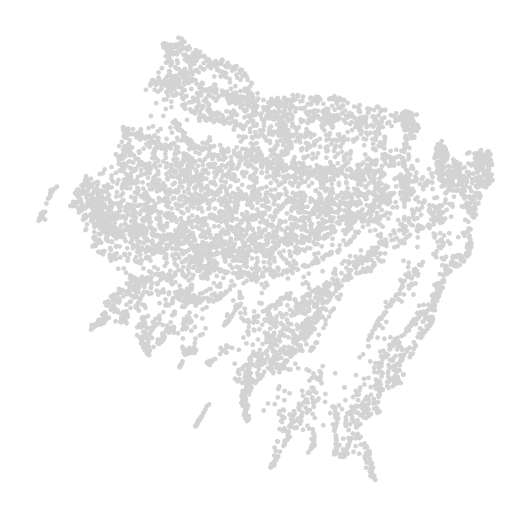

In [ ]:
sc.pl.umap(adata_target)

In [ ]:
#%%

genes = pd.read_csv(scriptsPath + '4_hdg/Tables/atlas_hdg_dispersion_patients_fibroblasts.csv', index_col=0)
# missing_gene = genes[~genes.index.isin(adata_target.var_names)].index
# missing_gene
# missing_gene = ['ZBTB20-AS2', 'OTUD6A']

In [ ]:
#%%

new_adata = adata_target.copy()
adataX = pd.DataFrame(adata_target.X.todense().T, index = adata_target.var_names, columns = adata_target.obs_names)
adataX = adataX.T
# adataX['ZBTB20-AS2'] = adataX['MT-CO1']*0
# adataX['OTUD6A'] = adataX['MT-CO1']*0
adata_new = sc.AnnData(adataX)
adata_new.obs = adata_target.obs

adata_new = remove_sparsity(adata_new) # remove sparsity
adata_new.X = adata_new.X.astype('float32')
### This function need pretrained reference model, corrected gene expression from reference data and incorrected query data

In [ ]:
new_adata

AnnData object with n_obs × n_vars = 6654 × 5179
    obs: 'tissue', 'developmental_stage', 'treatment', 'recurrence', 'tumor_stage', 'paper_ID', 'anatomical_location', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CancerMSK', 'EndothelialMSK', 'FibroblastsMSK', 'HematopoieticMSK', 'max', 'cell_types', 'SEACell', '# Single Cells', 'tissue-treatment', 'cell_type'
    var: 'highly_variable'
    uns: 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'distances', 'connectivities'

In [ ]:
#%%

adata_new.obs_names = adata_new.obs_names.str.replace("SEACell", "new_SEACell")
integrated_query = sca.models.scgen.map_query_data(reference_model = network,
                                                   corrected_reference = corrected_reference_adata,
                                                   query = adata_new,
                                                   batch_key = 'paper_ID',
                                                   return_latent=True)

/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scarches/models/scgen/vaearith_model.py:192: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  reference_query_adata = AnnData.concatenate(*[corrected_reference, query_adata_by_batches],
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/anndata/_core/merge.py:1362: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(



INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out: 1542 800
	Hidden Layer 1 in/out: 800 100
	Mean/Var Layer in/out: 100 10
Decoder Architecture:
	First Layer in, out 10 100
	Hidden Layer 1 in/out: 100 800
	Output Layer in/out:  800 1542 



/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scarches/models/scgen/vaearith.py:294: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  all_shared_ann = anndata.AnnData.concatenate(*shared_ct, batch_key="concat_batch", index_unique=None)
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scarches/models/scgen/vaearith.py:312: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  all_not_shared_ann = anndata.AnnData.concatenate(*not_shared_ct, batch_key="concat_batch", index_unique=None)
/usr/local/conda/envs/scarches/lib/python3.9/site-packages/scarches/models/scgen/vaearith.py:313: FutureWarning: Use anndata.concat in

In [ ]:
#%%

## Plot the latent space of integrated query and reference
sc.pp.neighbors(integrated_query, use_rep="latent_corrected")
sc.tl.umap(integrated_query)

category_of_interest = 'Zheng'
unique_categories = integrated_query.obs['dataset'].cat.categories
colors = ['#cccccc' if category != category_of_interest else '#C20078' for category in unique_categories]

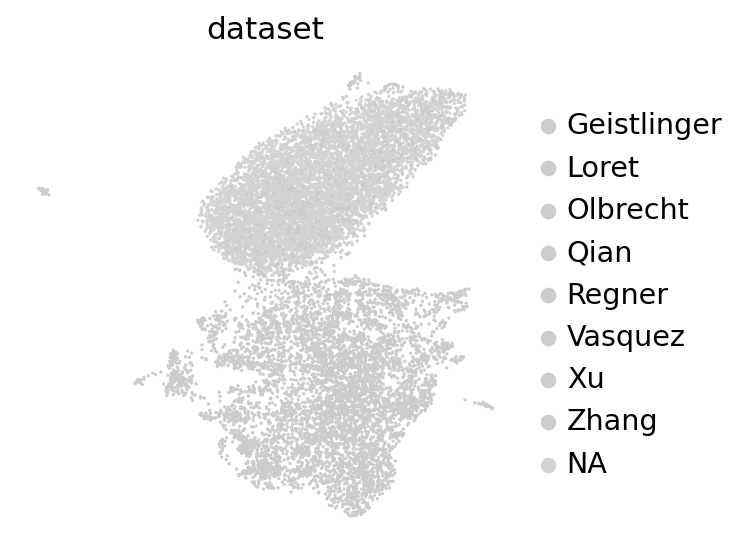

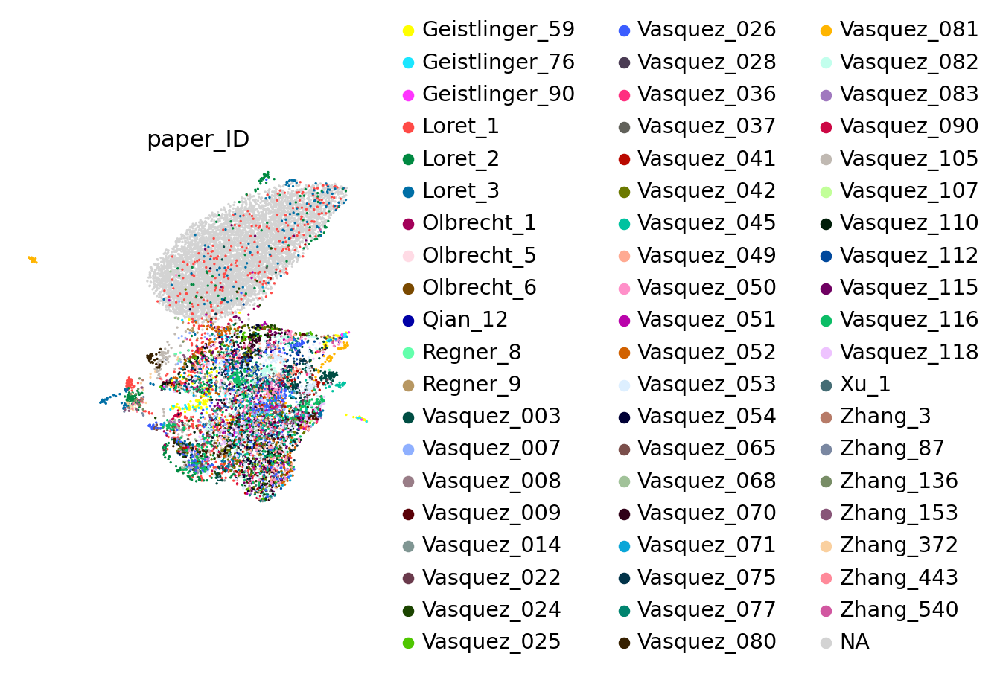

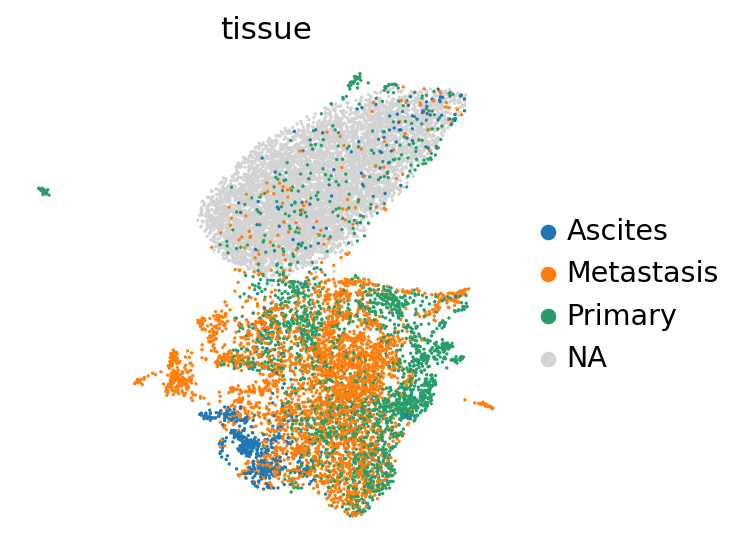

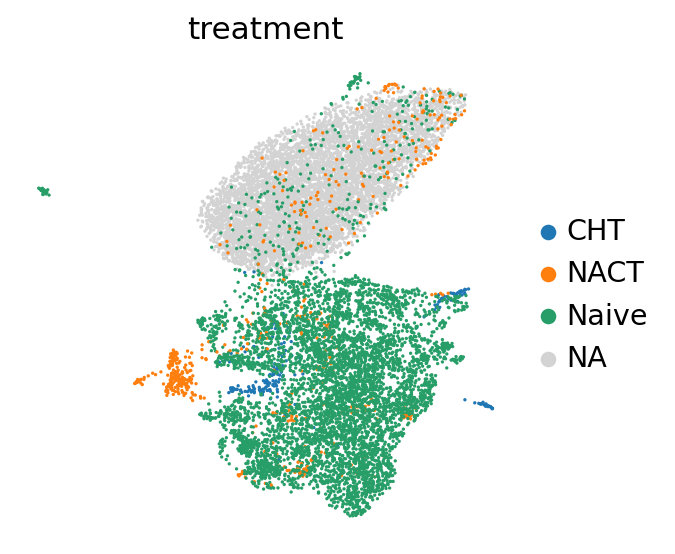

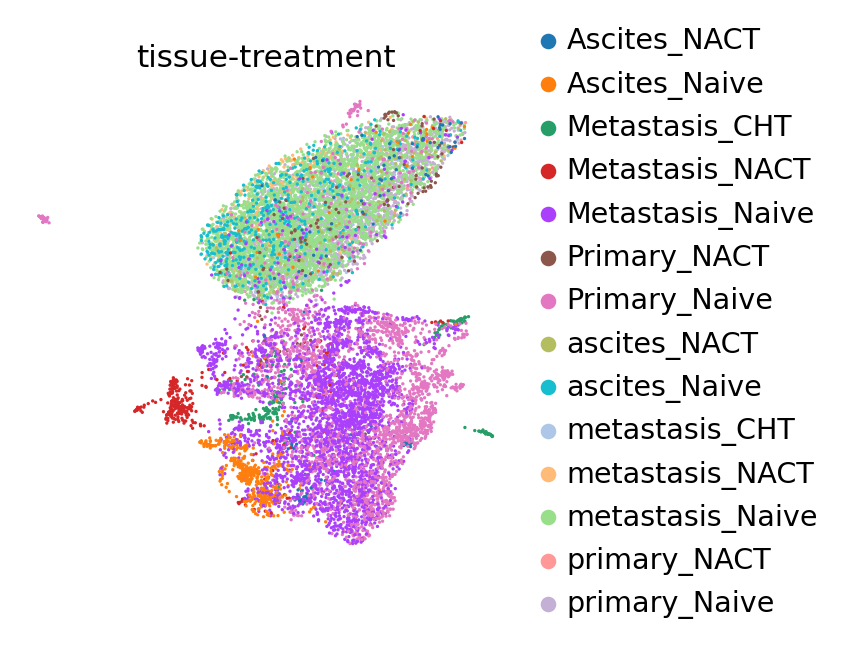

In [ ]:
#%%

sc.pl.umap(integrated_query, color='dataset', palette=colors, frameon=False, save='oose_dataset_latent.png')
sc.pl.umap(integrated_query, color='paper_ID', frameon=False, save='oose_patient_latent.png')
sc.pl.umap(integrated_query, color='tissue', frameon=False, save='oose_tissue_latent.png')
sc.pl.umap(integrated_query, color='treatment', frameon=False, save='oose_treatment_latent.png')
sc.pl.umap(integrated_query, color='tissue-treatment', frameon=False, save='oose_tissue-treatment_latent.png')

In [ ]:
integrated_query

AnnData object with n_obs × n_vars = 13293 × 1542
    obs: '02_tissue', '12_developmental_stage', '03_treatment', '11_recurrence', '10_tumor_stage', '14_paper_ID', '09_anatomical_location', '13_dataset', '08_phase', '07_cell_states', '05_cell_types', '06_cell_subtypes', '01_major_celltypes', '04_functional_annotation', 'tissue-treatment', 'cell_type', 'tissue', 'developmental_stage', 'treatment', 'recurrence', 'tumor_stage', 'paper_ID', 'anatomical_location', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CancerMSK', 'EndothelialMSK', 'FibroblastsMSK', 'HematopoieticMSK', 'max', 'cell_types', 'SEACell', '# Single Cells', 'reference_map', 'original_batch', 'concat_batch'
    uns: 'neighbors', 'umap', 'dataset_colors', 'paper_ID_colors', 'tissue_colors', 'treatment_colors', 'tissue-treatment_colors'
    obsm: 'latent_corrected', 'X_umap'
    layers: 'original_data'
    obsp: 'distances', 'connectivities'

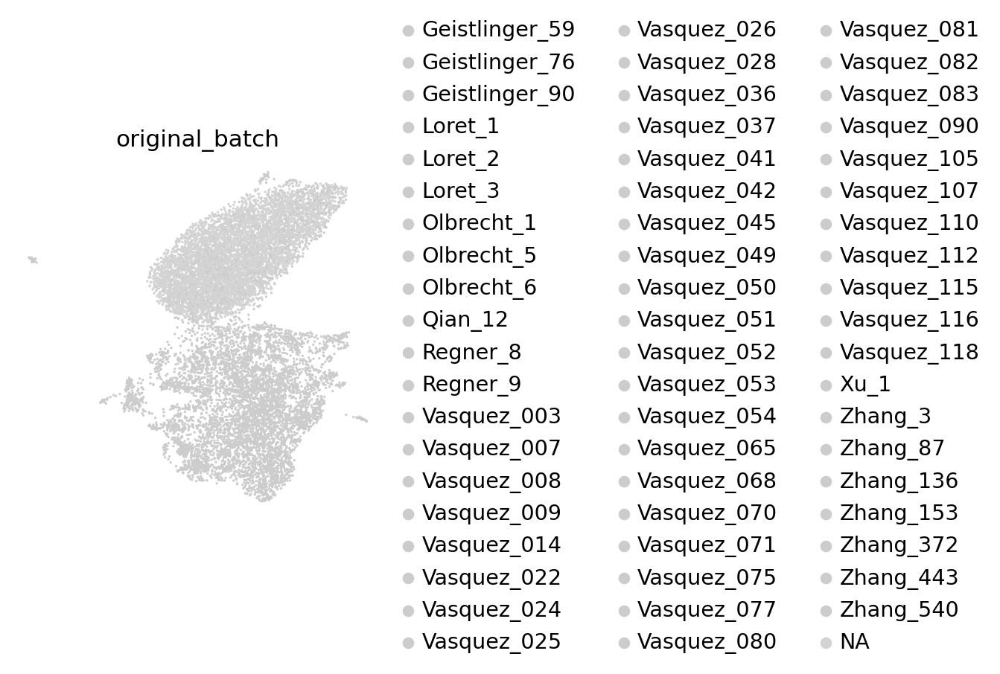

In [ ]:
sc.pl.umap(integrated_query, color='original_batch', palette=colors, frameon=False)




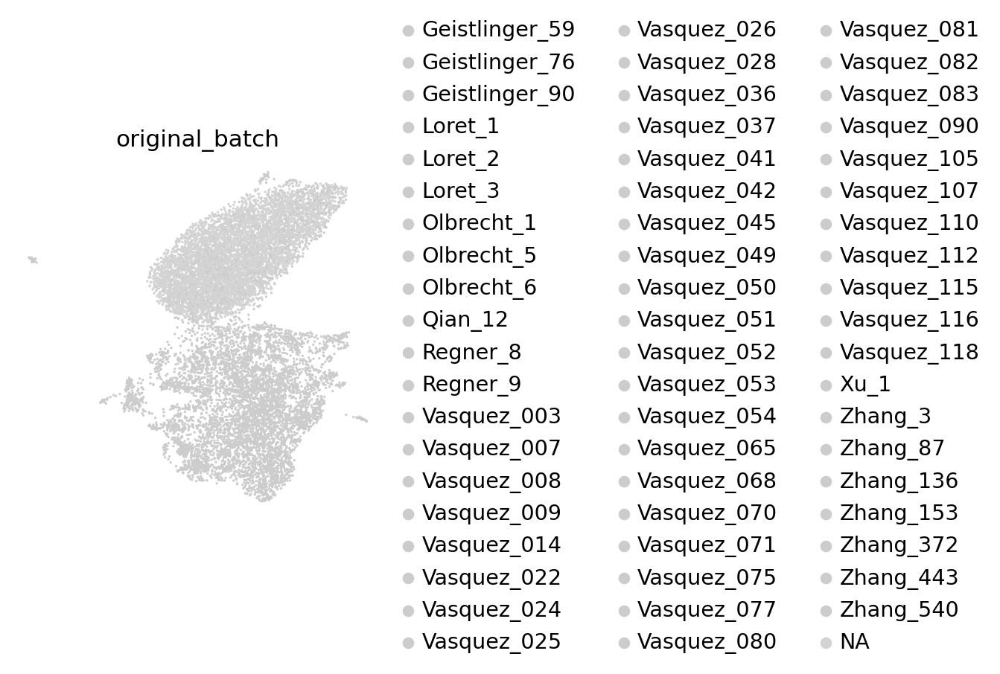

In [ ]:
sc.pl.umap(integrated_query, color='original_batch', frameon=False)




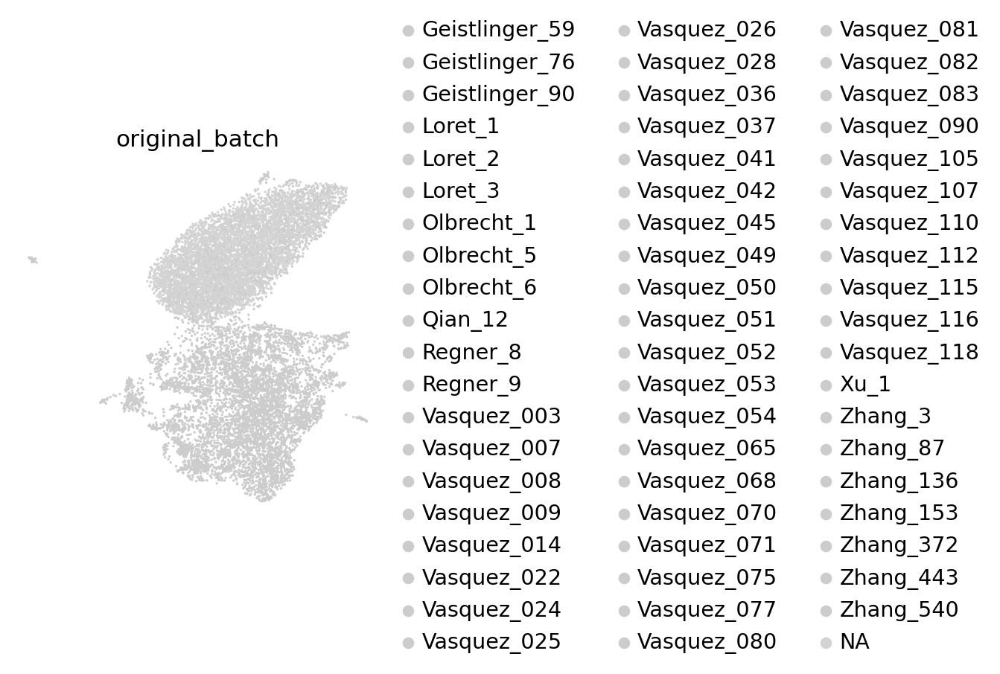

In [ ]:
sc.pl.umap(integrated_query, color='original_batch')




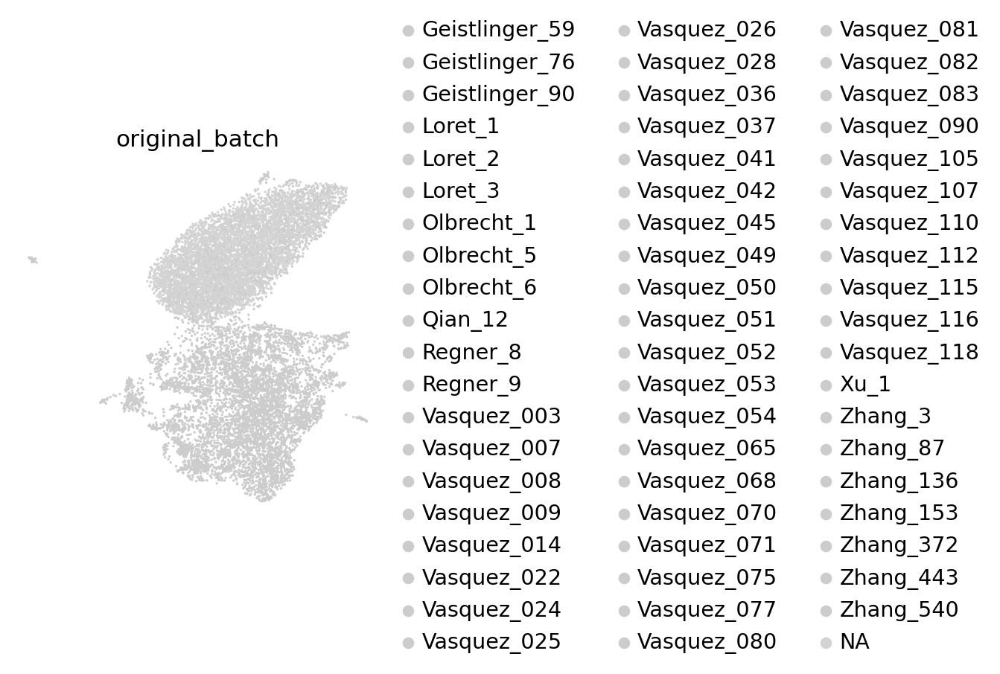

In [ ]:
sc.pl.umap(integrated_query, color='original_batch')

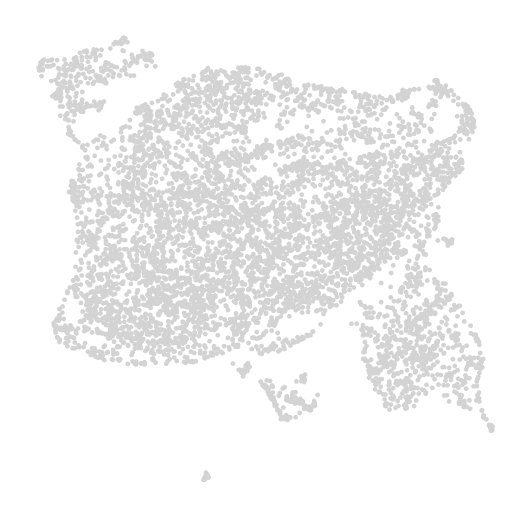

In [ ]:
sc.pl.umap(corrected_reference_adata)